<a href="https://colab.research.google.com/github/TSupattra/BADS7105_CRM/blob/main/03_Product%20Recommendation/Customer_Segmentation_Group_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Load Dependencies**

In [ ]:
!pip install pycaret

In [ ]:
import pandas as pd
from pycaret.clustering import *

# **Load Data**

In [ ]:
from google.colab import drive 
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
import pandas as pd 
df=pd.read_csv('/content/SupermarketData.csv')

In [ ]:
# import pandas as pd 
# df=pd.read_csv('/content/gdrive/MyDrive/Colab Notebooks/์NIDA Class/BADS7105 CRM/Supermarket Data.csv')

In [ ]:
df

,SHOP_WEEK,SHOP_DATE,SHOP_WEEKDAY,SHOP_HOUR,QUANTITY,SPEND,PROD_CODE,PROD_CODE_10,PROD_CODE_20,PROD_CODE_30,PROD_CODE_40,CUST_CODE,CUST_PRICE_SENSITIVITY,CUST_LIFESTAGE,BASKET_ID,BASKET_SIZE,BASKET_PRICE_SENSITIVITY,BASKET_TYPE,BASKET_DOMINANT_MISSION,STORE_CODE,STORE_FORMAT,STORE_REGION
0,200732,20071005,6,17,3,6.75,PRD0900001,CL00072,DEP00021,G00007,D00002,CUST0000583261,UM,YF,994107800547472,L,MM,Top Up,Grocery,STORE00001,LS,E02
1,200733,20071010,4,20,3,6.75,PRD0900001,CL00072,DEP00021,G00007,D00002,CUST0000537317,MM,OF,994107900512001,L,MM,Full Shop,Fresh,STORE00001,LS,E02
2,200741,20071209,1,11,1,2.25,PRD0900001,CL00072,DEP00021,G00007,D00002,CUST0000472158,MM,YF,994108700468327,L,MM,Full Shop,Grocery,STORE00001,LS,E02
3,200731,20070929,7,17,1,2.25,PRD0900001,CL00072,DEP00021,G00007,D00002,CUST0000099658,LA,OF,994107700237811,L,LA,Full Shop,Mixed,STORE00001,LS,E02
4,200737,20071110,7,14,3,6.75,PRD0900001,CL00072,DEP00021,G00007,D00002,NaN,NaN,NaN,994108300002212,L,MM,Full Shop,Fresh,STORE00001,LS,E02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
956569,200617,20060622,5,12,3,3.96,PRD0904997,CL00074,DEP00021,G00007,D00002,NaN,NaN,NaN,994101100088778,M,MM,Top Up,Fresh,STORE00002,LS,W01
956570,200633,20061013,6,20,3,3.96,PRD0904997,CL00074,DEP00021,G00007,D00002,NaN,NaN,NaN,994102700099738,L,LA,Top Up,Fresh,STORE00002,LS,W01
956571,200617,20060622,5,18,3,3.96,PRD0904997,CL00074,DEP00021,G00007,D00002,CUST0000544241,LA,YA,994101100506174,L,LA,Top Up,Fresh,STORE00002,LS,W01
956572,200619,20060706,5,19,3,3.96,PRD0904997,CL00074,DEP00021,G00007,D00002,CUST0000423155,LA,YF,994101300433650,L,LA,Full Shop,Fresh,STORE00002,LS,W01


In [ ]:
df['SHOP_DATE'] = df['SHOP_DATE'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))

In [ ]:
df.tail(5)

,SHOP_WEEK,SHOP_DATE,SHOP_WEEKDAY,SHOP_HOUR,QUANTITY,SPEND,PROD_CODE,PROD_CODE_10,PROD_CODE_20,PROD_CODE_30,PROD_CODE_40,CUST_CODE,CUST_PRICE_SENSITIVITY,CUST_LIFESTAGE,BASKET_ID,BASKET_SIZE,BASKET_PRICE_SENSITIVITY,BASKET_TYPE,BASKET_DOMINANT_MISSION,STORE_CODE,STORE_FORMAT,STORE_REGION
956569,200617,2006-06-22,5,12,3,3.96,PRD0904997,CL00074,DEP00021,G00007,D00002,NaN,NaN,NaN,994101100088778,M,MM,Top Up,Fresh,STORE00002,LS,W01
956570,200633,2006-10-13,6,20,3,3.96,PRD0904997,CL00074,DEP00021,G00007,D00002,NaN,NaN,NaN,994102700099738,L,LA,Top Up,Fresh,STORE00002,LS,W01
956571,200617,2006-06-22,5,18,3,3.96,PRD0904997,CL00074,DEP00021,G00007,D00002,CUST0000544241,LA,YA,994101100506174,L,LA,Top Up,Fresh,STORE00002,LS,W01
956572,200619,2006-07-06,5,19,3,3.96,PRD0904997,CL00074,DEP00021,G00007,D00002,CUST0000423155,LA,YF,994101300433650,L,LA,Full Shop,Fresh,STORE00002,LS,W01
956573,200635,2006-10-23,2,21,3,3.96,PRD0904997,CL00074,DEP00021,G00007,D00002,NaN,NaN,NaN,994102900104676,L,MM,Top Up,Fresh,STORE00002,LS,W01


In [ ]:
# df.info

In [ ]:
from sklearn.preprocessing import OneHotEncoder

In [ ]:
df["CUST_LIFESTAGE"] = df["CUST_LIFESTAGE"].astype(str) 

In [ ]:

# Import label encoder 
from sklearn import preprocessing
# label_encoder object knows how to understand word labels. 
label_encoder = preprocessing.LabelEncoder()
# Encode labels in column 'Country'. 
df['CUST_LIFESTAGE']= label_encoder.fit_transform(df['CUST_LIFESTAGE']) 
print(df.head())

   SHOP_WEEK  SHOP_DATE  SHOP_WEEKDAY  ...  STORE_CODE  STORE_FORMAT  STORE_REGION
0     200732 2007-10-05             6  ...  STORE00001            LS           E02
1     200733 2007-10-10             4  ...  STORE00001            LS           E02
2     200741 2007-12-09             1  ...  STORE00001            LS           E02
3     200731 2007-09-29             7  ...  STORE00001            LS           E02
4     200737 2007-11-10             7  ...  STORE00001            LS           E02

[5 rows x 22 columns]


In [ ]:
df[['CUST_LIFESTAGE']]

,CUST_LIFESTAGE
0,5
1,1
2,5
3,1
4,6
...,...
956569,6
956570,6
956571,4
956572,5


# **Prepare customer single view for Return Customer**

# Define features

Total visits = COUNT(DISTINCT BASKET ID)

Ticket size = SUM(SPEND)/COUNT(DISTINCT BASKET ID)

Total no. of SKUs


# Calculate features

In [ ]:
##prepare customer single view
test = df_groupby = df[df['CUST_CODE'].notnull()].groupby(by=['CUST_CODE']).agg(TotalSpend=('SPEND', 'sum'),
                                                                                  TotalVisits=('BASKET_ID', 'nunique'),
                                                                                  TotalSKUs=('PROD_CODE', 'nunique'),
                                                                                  FirstDate=('SHOP_DATE', 'min'),
                                                                                  LastDate=('SHOP_DATE', 'max'),
                                                                                  ToTalQUANTITY=('QUANTITY','sum')

                                                                                  ).reset_index()

In [ ]:
##prepare customer single view
df_csv = df_groupby = df[df['CUST_CODE'].notnull()].groupby(by=['CUST_CODE']).agg(TotalSpend=('SPEND', 'sum'),
                                                                                  TotalVisits=('BASKET_ID', 'nunique'),
                                                                                  TotalSKUs=('PROD_CODE', 'nunique'),
                                                                                  FirstDate=('SHOP_DATE', 'min'),
                                                                                  LastDate=('SHOP_DATE', 'max'),
                                                                                  ToTalQUANTITY=('QUANTITY','sum')

                                                                                  ).reset_index()

In [ ]:
##calculate ticket size
df_csv['TicketSize'] = df_csv['TotalSpend']/df_csv['TotalVisits']

In [ ]:
##find max date in the dataset
max_date = df_csv['LastDate'].max()

In [ ]:
##calculate total days of the relationship
df_csv['total_days'] = (df_csv['LastDate'] - df_csv['FirstDate']).dt.days + 1

In [ ]:
##calculate recency days
df_csv['recency'] = (max_date - df_csv['LastDate']).dt.days

In [ ]:
df_csv.head(10)

,CUST_CODE,TotalSpend,TotalVisits,TotalSKUs,FirstDate,LastDate,ToTalQUANTITY,TicketSize,total_days,recency
0,CUST0000000181,2.44,1,1,2007-01-06,2007-01-06,1,2.440000,1,547
1,CUST0000000369,959.33,220,189,2006-04-16,2008-07-05,923,4.360591,812,1
2,CUST0000000689,328.57,16,116,2007-07-22,2008-06-23,334,20.535625,338,13
3,CUST0000000998,5.95,3,4,2006-05-04,2006-07-07,6,1.983333,65,730
4,CUST0000001163,39.74,4,24,2006-10-22,2008-06-22,34,9.935000,610,14
5,CUST0000001194,2493.83,103,403,2006-04-22,2008-06-20,1705,24.211942,791,16
6,CUST0000002257,1.99,1,1,2006-07-21,2006-07-21,1,1.990000,1,716
7,CUST0000002499,0.34,1,1,2006-04-14,2006-04-14,1,0.340000,1,814
8,CUST0000002605,1.80,6,1,2006-10-08,2008-06-12,6,0.300000,614,24
9,CUST0000002637,124.63,15,53,2006-08-03,2008-05-30,126,8.308667,667,37


Avg. between each transection.

Freq. of TotalSpend with total_days

In [ ]:
##calculate Freq. of Total_Days with totalVisits
# df_csv['Freq_Visit'] = round(df_csv['TotalVisits']/df_csv['total_days'],2) *100


In [ ]:
df_csv['ToTalQUANTITY_TotalVisits'] = round(df_csv['ToTalQUANTITY']/df_csv['TotalVisits'],0) 

In [ ]:
df_csv['Totaldays_TotalVisits'] = round(df_csv['total_days']/df_csv['TotalVisits'],2) 

In [ ]:
df_csv['Time_be_member'] = df_csv['total_days']+df_csv['recency']

In [ ]:
# del df_csv['Freq_Visit']

In [ ]:
df_csv.head(10)

,CUST_CODE,TotalSpend,TotalVisits,TotalSKUs,FirstDate,LastDate,ToTalQUANTITY,TicketSize,total_days,recency,ToTalQUANTITY_TotalVisits,Totaldays_TotalVisits,Time_be_member
0,CUST0000000181,2.44,1,1,2007-01-06,2007-01-06,1,2.440000,1,547,1.0,1.00,548
1,CUST0000000369,959.33,220,189,2006-04-16,2008-07-05,923,4.360591,812,1,4.0,3.69,813
2,CUST0000000689,328.57,16,116,2007-07-22,2008-06-23,334,20.535625,338,13,21.0,21.12,351
3,CUST0000000998,5.95,3,4,2006-05-04,2006-07-07,6,1.983333,65,730,2.0,21.67,795
4,CUST0000001163,39.74,4,24,2006-10-22,2008-06-22,34,9.935000,610,14,8.0,152.50,624
5,CUST0000001194,2493.83,103,403,2006-04-22,2008-06-20,1705,24.211942,791,16,17.0,7.68,807
6,CUST0000002257,1.99,1,1,2006-07-21,2006-07-21,1,1.990000,1,716,1.0,1.00,717
7,CUST0000002499,0.34,1,1,2006-04-14,2006-04-14,1,0.340000,1,814,1.0,1.00,815
8,CUST0000002605,1.80,6,1,2006-10-08,2008-06-12,6,0.300000,614,24,1.0,102.33,638
9,CUST0000002637,124.63,15,53,2006-08-03,2008-05-30,126,8.308667,667,37,8.0,44.47,704


In [ ]:
df_Return_customer = df_csv[df_csv.TotalVisits != 1 ]

In [ ]:
# df_csv = df_csv[df_csv.CUST_LIFESTAGE != 6 ]?

In [ ]:
df_Return_customer['TotalSKUs_TotalVisits'] = round(df_Return_customer['TotalSKUs']/df_Return_customer['TotalVisits'],0)


In [ ]:
df_Return_customer['diff'] = round(df_Return_customer['ToTalQUANTITY_TotalVisits']/df_Return_customer['TotalSKUs_TotalVisits'],0)

In [ ]:
df_Return_customer.head(5)

,CUST_CODE,TotalSpend,TotalVisits,TotalSKUs,FirstDate,LastDate,ToTalQUANTITY,TicketSize,total_days,recency,ToTalQUANTITY_TotalVisits,Totaldays_TotalVisits,Time_be_member,TotalSKUs_TotalVisits,diff
1,CUST0000000369,959.33,220,189,2006-04-16,2008-07-05,923,4.360591,812,1,4.0,3.69,813,1.0,4.0
2,CUST0000000689,328.57,16,116,2007-07-22,2008-06-23,334,20.535625,338,13,21.0,21.12,351,7.0,3.0
3,CUST0000000998,5.95,3,4,2006-05-04,2006-07-07,6,1.983333,65,730,2.0,21.67,795,1.0,2.0
4,CUST0000001163,39.74,4,24,2006-10-22,2008-06-22,34,9.935000,610,14,8.0,152.50,624,6.0,1.0
5,CUST0000001194,2493.83,103,403,2006-04-22,2008-06-20,1705,24.211942,791,16,17.0,7.68,807,4.0,4.0


In [ ]:
# del df_csv['diff_ToTalQUANTITY_TotalSKUs']

In [ ]:
# Standard imports

import numpy as np

import pandas as pd

from matplotlib import pyplot as plt

import seaborn as sns

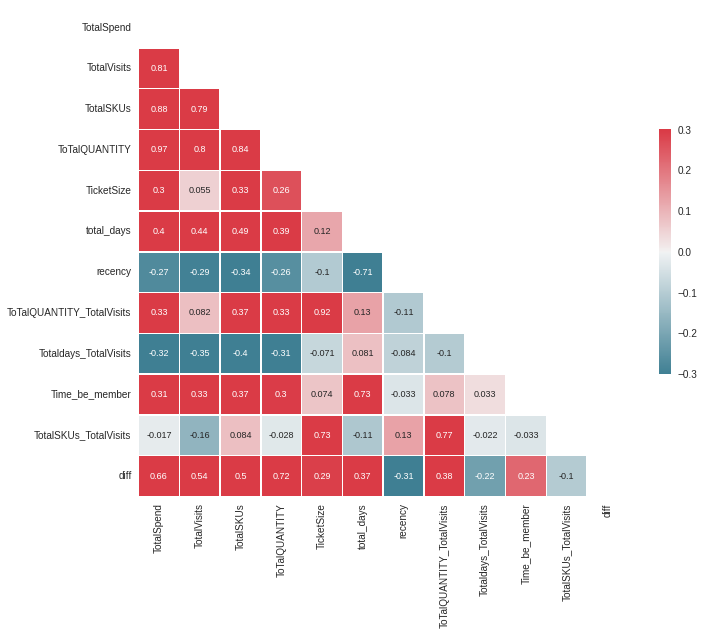

In [ ]:
# Create the correlation matrix

corr = df_Return_customer.corr()



# Generate a mask for the upper triangle; True = do NOT show

mask = np.zeros_like(corr, dtype=np.bool)

mask[np.triu_indices_from(mask)] = True



# Set up the matplotlib figure

f, ax = plt.subplots(figsize=(11, 9))



# Generate a custom diverging colormap

cmap = sns.diverging_palette(220, 10, as_cmap=True)



# Draw the heatmap with the mask and correct aspect ratio

# More details at https://seaborn.pydata.org/generated/seaborn.heatmap.html

sns.heatmap(

    corr,          # The data to plot

    mask=mask,     # Mask some cells

    cmap=cmap,     # What colors to plot the heatmap as

    annot=True,    # Should the values be plotted in the cells?

    vmax=.3,       # The maximum value of the legend. All higher vals will be same color

    vmin=-.3,      # The minimum value of the legend. All lower vals will be same color

    center=0,      # The center value of the legend. With divergent cmap, where white is

    square=True,   # Force cells to be square

    linewidths=.5, # Width of lines that divide cells

    cbar_kws={"shrink": .5}  # Extra kwargs for the legend; in this case, shrink by 50%

)



# You can save this as a png with

# f.savefig('heatmap_colored_correlation_matrix_seaborn_python.png')

In [ ]:
df_Return_customer.head(5)

,CUST_CODE,TotalSpend,TotalVisits,TotalSKUs,FirstDate,LastDate,ToTalQUANTITY,TicketSize,total_days,recency,ToTalQUANTITY_TotalVisits,Totaldays_TotalVisits,Time_be_member,TotalSKUs_TotalVisits,diff
1,CUST0000000369,959.33,220,189,2006-04-16,2008-07-05,923,4.360591,812,1,4.0,3.69,813,1.0,4.0
2,CUST0000000689,328.57,16,116,2007-07-22,2008-06-23,334,20.535625,338,13,21.0,21.12,351,7.0,3.0
3,CUST0000000998,5.95,3,4,2006-05-04,2006-07-07,6,1.983333,65,730,2.0,21.67,795,1.0,2.0
4,CUST0000001163,39.74,4,24,2006-10-22,2008-06-22,34,9.935000,610,14,8.0,152.50,624,6.0,1.0
5,CUST0000001194,2493.83,103,403,2006-04-22,2008-06-20,1705,24.211942,791,16,17.0,7.68,807,4.0,4.0


In [ ]:
df_csv_1TimesVisit = df_csv[df_csv.TotalVisits == 1 ]

In [ ]:
count_return_customer = len(pd.unique(df_Return_customer['CUST_CODE']))
# count_return_customer

In [ ]:
count_OneVisit_customer = len(pd.unique(df_csv_1TimesVisit['CUST_CODE']))
# count_OneVisit_customer

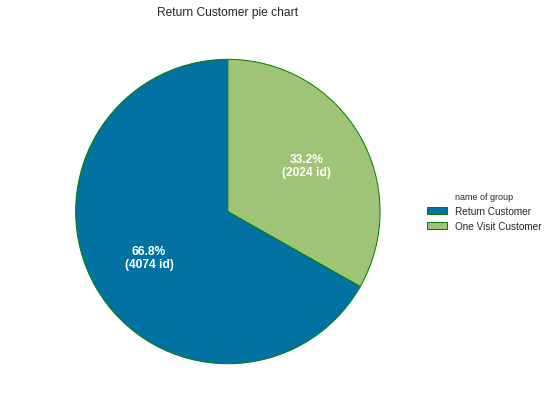

In [ ]:
# Import libraries
import numpy as np
import matplotlib.pyplot as plt
  
  
# Creating dataset
TypeOfCustomer = ['Return Customer', 'One Visit Customer']
  
data = [count_return_customer, count_OneVisit_customer]
  
# Wedge properties
wp = { 'linewidth' : 1, 'edgecolor' : "green" }
  
# Creating autocpt arguments
def func(pct, allvalues):
    absolute = int(pct / 100.*np.sum(allvalues))
    return "{:.1f}%\n({:d} id)".format(pct, absolute)
  
# Creating plot
fig, ax = plt.subplots(figsize =(10, 7))
wedges, texts, autotexts = ax.pie(data, 
                                  autopct = lambda pct: func(pct, data),
                                  
                                  labels = TypeOfCustomer,
                                
                                 
                                  startangle = 90,
                                  wedgeprops = wp,
                                  textprops = dict(color="w")
                                  )
  
# Adding legend
ax.legend(wedges, TypeOfCustomer,
          title ="name of group",
          loc ="center left",
          bbox_to_anchor =(1, 0, 0.5, 1))
  
plt.setp(autotexts, size = 12, weight ="bold")
ax.set_title("Return Customer pie chart")
  
# show plot
plt.show()

# **Cluster customers**

In [ ]:
exp_clu = setup(data=df_Return_customer, ignore_features=['CUST_CODE','FirstDate', 'LastDate','Time_be_member','ToTalQUANTITY_TotalVisits','TotalSKUs_TotalVisits','diff'], normalize=True)

,Description,Value
0,session_id,3360
1,Original Data,"(4075, 15)"
2,Missing Values,False
3,Numeric Features,8
4,Categorical Features,0
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(4075, 8)"
9,CPU Jobs,-1


In [ ]:
models()

,Name,Reference
ID,,
kmeans,K-Means Clustering,sklearn.cluster._kmeans.KMeans
ap,Affinity Propagation,sklearn.cluster._affinity_propagation.Affinity...
meanshift,Mean Shift Clustering,sklearn.cluster._mean_shift.MeanShift
sc,Spectral Clustering,sklearn.cluster._spectral.SpectralClustering
hclust,Agglomerative Clustering,sklearn.cluster._agglomerative.AgglomerativeCl...
dbscan,Density-Based Spatial Clustering,sklearn.cluster._dbscan.DBSCAN
optics,OPTICS Clustering,sklearn.cluster._optics.OPTICS
birch,Birch Clustering,sklearn.cluster._birch.Birch
kmodes,K-Modes Clustering,kmodes.kmodes.KModes


In [ ]:
get_metrics()

,Name,Display Name,Score Function,Scorer,Target,Args,Greater is Better,Needs Ground Truth,Custom
ID,,,,,,,,,
silhouette,Silhouette,Silhouette,<function silhouette_score at 0x7fa881a98c20>,make_scorer(silhouette_score),pred,{},True,False,False
chs,Calinski-Harabasz,Calinski-Harabasz,<function calinski_harabasz_score at 0x7fa881a...,make_scorer(calinski_harabasz_score),pred,{},True,False,False
db,Davies-Bouldin,Davies-Bouldin,<function davies_bouldin_score at 0x7fa881a98f80>,make_scorer(davies_bouldin_score),pred,{},True,False,False
hs,Homogeneity Score,Homogeneity,<function homogeneity_score at 0x7fa881d0dcb0>,make_scorer(homogeneity_score),pred,{},True,True,False
ari,Rand Index,Rand Index,<function adjusted_rand_score at 0x7fa881d0da70>,make_scorer(adjusted_rand_score),pred,{},True,True,False
cs,Completeness Score,Completeness,<function completeness_score at 0x7fa881d0dd40>,make_scorer(completeness_score),pred,{},True,True,False


# Compare model performance

In [ ]:
metrics = []
for model in models().index:
    if model in ['meanshift', 'optics']:
        continue
    create_model(model)
    metric_result = pull()
    metric_result['model'] = model
    metrics.append(metric_result)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0627,22.2012,7.2849,0,0,0


In [ ]:
cluster_metrics = pd.concat(metrics)
cluster_metrics.set_index("model", inplace=True)
cluster_metrics.sort_values(by='Silhouette', ascending=False, inplace=True)
cluster_metrics.style.highlight_max(subset=['Silhouette', 'Calinski-Harabasz'], color = 'green', axis = 0).highlight_min(subset=['Davies-Bouldin'], color = 'green', axis = 0)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
model,,,,,,
sc,0.892800,129.354900,0.073500,0,0,0
birch,0.401400,902.154400,0.748300,0,0,0
kmeans,0.286200,1948.706900,1.141300,0,0,0
hclust,0.268500,1632.258500,1.108200,0,0,0
ap,0.209000,830.788700,1.069900,0,0,0
kmodes,-0.062700,22.201200,7.284900,0,0,0
dbscan,-0.133900,130.460300,1.858800,0,0,0


# Spectral Clustering Clustering

In [ ]:
sc = create_model('sc')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.8928,129.3549,0.0735,0,0,0


In [ ]:
plot_model(sc)

# KMeans Clustering

In [ ]:
kmeans = create_model('kmeans')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2862,1948.7069,1.1413,0,0,0


In [ ]:
print(kmeans)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=3360, tol=0.0001, verbose=0)


In [ ]:
plot_model(kmeans)

In [ ]:
results_Return_Customer = assign_model(kmeans)

In [ ]:
results_Return_Customer

,CUST_CODE,TotalSpend,TotalVisits,TotalSKUs,FirstDate,LastDate,ToTalQUANTITY,TicketSize,total_days,recency,ToTalQUANTITY_TotalVisits,Totaldays_TotalVisits,Time_be_member,TotalSKUs_TotalVisits,diff,Cluster
1,CUST0000000369,959.33,220,189,2006-04-16,2008-07-05,923,4.360591,812,1,4.0,3.69,813,1.0,4.0,Cluster 1
2,CUST0000000689,328.57,16,116,2007-07-22,2008-06-23,334,20.535625,338,13,21.0,21.12,351,7.0,3.0,Cluster 1
3,CUST0000000998,5.95,3,4,2006-05-04,2006-07-07,6,1.983333,65,730,2.0,21.67,795,1.0,2.0,Cluster 2
4,CUST0000001163,39.74,4,24,2006-10-22,2008-06-22,34,9.935000,610,14,8.0,152.50,624,6.0,1.0,Cluster 0
5,CUST0000001194,2493.83,103,403,2006-04-22,2008-06-20,1705,24.211942,791,16,17.0,7.68,807,4.0,4.0,Cluster 3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6094,CUST0000999569,700.21,109,47,2006-09-01,2008-07-04,290,6.423945,673,2,3.0,6.17,675,0.0,inf,Cluster 1
6095,CUST0000999593,453.58,30,206,2006-05-06,2008-04-02,395,15.119333,698,95,13.0,23.27,793,7.0,2.0,Cluster 1
6096,CUST0000999645,105.11,11,46,2006-04-30,2008-05-08,91,9.555455,740,59,8.0,67.27,799,4.0,2.0,Cluster 1
6098,CUST0000999935,444.17,21,127,2006-11-29,2008-06-05,343,21.150952,555,31,16.0,26.43,586,6.0,3.0,Cluster 1


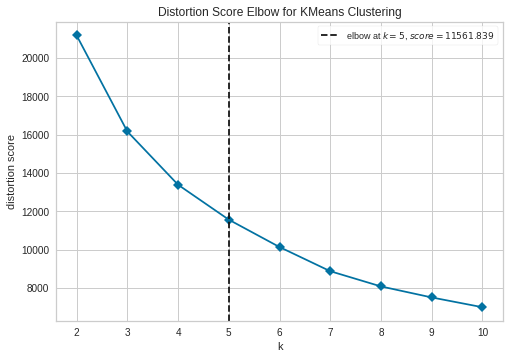

In [ ]:
plot_model(kmeans, plot = 'elbow')

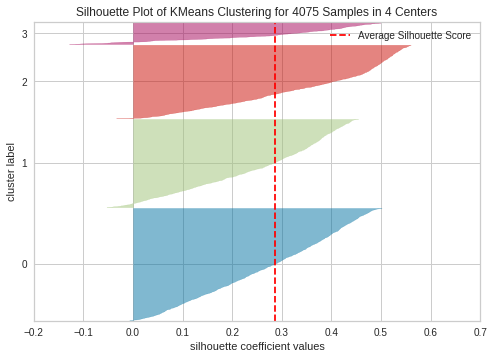

In [ ]:
plot_model(kmeans, plot = 'silhouette')

## https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html

# **Interpret results and plan for actions**

In [ ]:
plot_model(kmeans, plot = 'distribution')

In [ ]:
n = len(pd.unique(df['CUST_CODE']))
print(n)

6101


In [ ]:
results_Return_Customer['Cluster'].value_counts()

Cluster 0    1548
Cluster 1    1218
Cluster 2    1013
Cluster 3     296
Name: Cluster, dtype: int64

In [ ]:
Cluster_0_R =results_Return_Customer[results_Return_Customer.Cluster =='Cluster 0' ]
Cluster_1_R =results_Return_Customer[results_Return_Customer.Cluster =='Cluster 1' ]
Cluster_2_R =results_Return_Customer[results_Return_Customer.Cluster =='Cluster 2' ]
Cluster_3_R =results_Return_Customer[results_Return_Customer.Cluster =='Cluster 3' ]

In [ ]:
index = Cluster_0_R.index
C_0_R = len(index)

index = Cluster_1_R.index
C_1_R = len(index)

index = Cluster_2_R.index
C_2_R = len(index)

index = Cluster_3_R.index
C_3_R = len(index)

In [ ]:
C_0_R

1548

**TotalSpend**

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'TotalSpend')

**TotalVisits**

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'TotalVisits')

**TotalSKUs**

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'TotalSKUs')

**TicketSize** (บอกเกี่ยวกับ Revenue ต่อการมาใช้บริการ 1 ครั้ง)

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'TicketSize')

**total_days**

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'total_days')

**Time to be a member** (บอกเกี่ยวกับระยะเวลาที่เป็นสมาชิก)

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'Time_be_member')

**recency**


In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'recency')

**Freq_Visit** (บอกเกี่ยวกับความถี่ในการมาใช้บริการ)


In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'Totaldays_TotalVisits')

**Quantity_Totalvisits** (บอกเกี่ยวกับจำนวนสินค้าเฉลี่ย ต่อการมาใช้บริการ)

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'ToTalQUANTITY_TotalVisits')

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'diff')

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'TotalSKUs_TotalVisits')

In [ ]:
# results[results.Cluster =='Cluster 3' ].describe()

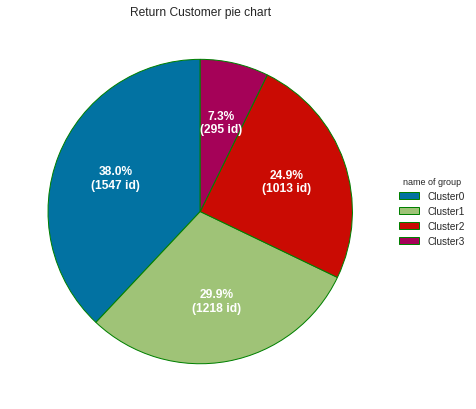

In [ ]:
# Import libraries
import numpy as np
import matplotlib.pyplot as plt
  
  
# Creating dataset
TypeOfCustomer = ['Cluster0', 'Cluster1','Cluster2','Cluster3']
  
data = [C_0_R, C_1_R,C_2_R,C_3_R]
  
  
# Wedge properties
wp = { 'linewidth' : 1, 'edgecolor' : "green" }
  
# Creating autocpt arguments
def func(pct, allvalues):
    absolute = int(pct / 100.*np.sum(allvalues))
    return "{:.1f}%\n({:d} id)".format(pct, absolute)
  
# Creating plot
fig, ax = plt.subplots(figsize =(10, 7))
wedges, texts, autotexts = ax.pie(data, 
                                  autopct = lambda pct: func(pct, data),
                                  
                                  labels = TypeOfCustomer,
                                
                                 
                                  startangle = 90,
                                  wedgeprops = wp,
                                  textprops = dict(color="w")
                                  )
  
# Adding legend
ax.legend(wedges, TypeOfCustomer,
          title ="name of group",
          loc ="center left",
          bbox_to_anchor =(1, 0, 0.5, 1))
  
plt.setp(autotexts, size = 12, weight ="bold")
ax.set_title("Return Customer pie chart")
  
# show plot
plt.show()

#### **ผลลัพธ์จากการแบ่งกลุ่มของลูกค้าประจำ (ลูกค้าที่มีการใช้บริการตั้งแต่ 2 ครั้งขึ้นไป)โดยใช้ KMeans Clustering สรุปได้ดังนี้**
### **1.) Cluster 0** : More Ticket size
- จำนวนลูกค้า ~ 1,548 คน (~29.9% ของลูกค้าประจำ และ ~25.36 % ของลูกค้าทั้งหมด) 
- รายรับจากลูกค้า (Total spend) ของกลุ่ม 0 สูงเป็นลำดับที่ 3 ส่วนรายรับเฉลี่ยต่อคน (Ticket size) ของกลุ่ม 0 น้อยที่สุด 
- ลูกค้ามีระยะเวลา ~ 132 วันต่อ 1 transaction (~ 4.5 เดือน)
- ลูกค้ามาที่ร้านครั้งล่าสุด (Recency) ~ 86 วันก่อน  
- ปริมาณที่ซื้อต่อครั้ง ~ 5.62 ชิ้น ต่อการมีใช้บริการ (ลำดับที่ 4)
- Total visit = 5.45 ครั้ง (ลำดับที่ 3)
- time be member = 609.75 (ลำดับที่ 3)

จากข้อมูลข้างต้น สรุปได้ว่าลูกค้ากลุ่มที่ 0 นี้มียอดซื้อรวมเป็นลำดับที่ 3  ปริมาณที่ซื้อต่อครั้งสูงเป็นลำดับที่ 3, ลูกค้ามาครั้งล่าสุดเมื่อ ~ 86 วันก่อน ระยะเวลาต่อ transaction ประมาณ ~ 4.5 เดือน วัน พบว่าลูกค้าหายไปนานจนผิดปกติ มีความเป็นไปได้ว่าลูกค้าอาจไปซื้อสินค้าจากร้านอื่น หรือเป็นกลุ่มที่เข้ามาซื้อของเพื่อเอา Promotion เป็นพวก bargain hunter เมื่อประกอบกับ total visit และ time be member น้อยเป็นลำดับที่ 3       
**หน้าที่ของเราคือ** จัดการกลุ่ม bargain hunterและ ทำให้ลูกค้าที่ดีแต่ไปซื้อร้านอื่นกลับมา reactivate    
**1.ทำ 2x2 matrix** เพื่อจัดการกลุ่ม bargain hunter  
**2.ทำ Recommend additional products** เพื่อใช้ทำ product association analysis  
**3.Spend stretch discount** คือการซื้อสินค้าหนึ่งจะได้รับส่วนลดอีกสินค้าหนึ่ง  

### **2.) Cluster 1** : More Engagement
- จำนวนลูกค้า ~ 1,218 คน (~ 29.89 % ของลูกค้าประจำ และ ~ 19.96 % ของลูกค้าทั้งหมด) 
- รายรับจากลูกค้า (Total spend) และรายรับเฉลี่ยต่อคน (Ticket size) ของกลุ่ม 1 สูงเป็นลำดับที่ 2 
- ลูกค้ามีระยะเวลา ~ 30 วันต่อ 1 transaction (~ 1 เดือน) 
- ลูกค้ามาครั้งล่าสุด (Recency) เมื่อ ~ 27 วันก่อน 
- ปริมาณที่ซื้อต่อครั้ง ~ 12 ชิ้น ต่อการมีใช้บริการ (ลำดับที่ 2)

จากข้อมูลข้างต้น สรุปได้ว่าลูกค้ากลุ่มที่ 1 ลูกค้ากลุ่มนี้เป็นกลุ่มที่มียอดการซื้อสินค้าที่สูง, ปริมาณซื้อที่สูง, ลูกค้ากลุ่มนี้มีมาครั้งล่าสุด ~ 1 เดือนก่อนเมื่อเทียบกับ ระยะเวลาต่อ transaction ~ 1 เดือน ซึ่งยังอยู่ในช่วงเวลาไม่ผิดปกติ , มี Total visit มากที่สุด, ลูกค้ากลุ่มนี้เป็นสมาชิกมานานสูงเป็นลำดับที่  2 จากทั้ง 4 กลุ่ม (Time be member)  
**หน้าที่ของเราคือ เพิ่ม Engagement เพื่อสร้างความสัมพันธ์ที่ดีในระยะยาว ระหว่างแบรนด์และลูกค้า**    
**1.Influencer Marketing**  
**2.Daily promotional specials**  
**3.การให้ Coupons** หลังการซื้อ โดยมีในระยะเวลาหมดอายุที่สั้นเพื่อกระตุ้นให้ลูกค้ากลับมาซื้อใหม่เร็วขึ้น ซื้อในปริมาณมากขึ้น  
**4.ทดสอบการตลาดกับกลุ่มควบคุม** เพื่อยืนยันว่าการเข้าชมบ่อยขึ้นจะส่งผลให้รายได้รวมสูงขึ้นหรือระดับรายได้ทั้งหมดไม่เปลี่ยนแปลงมากนัก (ความถี่สูงขึ้น, มูลค่าต่อ transaction ที่ต่ำลง)


### **3.) Cluster 2** : Bargain Hunter
- จำนวนลูกค้า ~ 1,013 คน (~24.86% ของลูกค้าประจำ และ ~16.6 % ของลูกค้าทั้งหมด) 
- รายรับจากลูกค้า (Total spend) ของกลุ่ม 2 น้อยที่สุด ส่วนรายรับเฉลี่ยต่อคน (Ticket size) ของกลุ่ม 1 เป็นลำดับที่ 3 
- ลูกค้ามีระยะเวลา ~ 38.21 วันต่อ 1 transaction (~ 1เดือน)
- ลูกค้ามาครั้งล่าสุด (Recency) เมื่อ ~ 385 วันก่อน (~ 1 ปี 1 เดือน) 
- ปริมาณที่ซื้อต่อครั้ง ~ 6.92 ชิ้น (ลำดับที่ 3)
- Total visit = 3.53 ครั้ง (ลำดับที่ 4)
- time be member = 507.15 (ลำดับที่ 4)  

จากข้อมูลข้างต้น สรุปได้ว่าลูกค้ากลุ่มที่ 2 เป็นกลุ่ม ลูกค้ากลุ่มนี้มียอดซื้อรวมสินค้าน้อยที่สุด ปริมาณที่ซื้อต่อครั้งสูงเป็นลำดับที่ 3 มาครั้งล่าสุดเมื่อ 1 ปีก่อน ระยะเวลาต่อ transsaction ประมาณ 38.21 วัน แสดงว่าลูกค้าหายไปนานจนผิดปกติ มีความเป็นไปได้ว่าลูกค้าอาจไปซื้อสินค้าจากร้านอื่น หรือเป็นกลุ่มที่เข้ามาซื้อของเพื่อเอา Promotion เป็นพวก bargain hunter เมื่อประกอบกับ total visit และ time be member น้อยที่สุดกว่ากลุ่มอื่น   
**หน้าที่ของเราคือ** จัดการกลุ่ม bargain hunterและ ทำให้ลูกค้าที่ดีแต่ไปซื้อร้านอื่นกลับมา   
**1.ทำ 2x2 matrix** เพื่อจัดการกลุ่ม bargain hunter  
**2.ให้ Coupon discount** กลุ่มที่เป็นลูกค้าร้านอื่นเพื่อดึงมาซื้อร้าน  
**3.ทำ Churn analysis** ดูลูกค้าว่าไปเป็นลูกค้าร้านไหน คู่แข่งเป็นใคร อะไรเป็นสิ่งที่ดึงลูกค้าไป 
 
### **4.) Cluster 3** : Upper Class
- มีจำนวนลูกค้า ~ 296 คน (~7.26% ของลูกค้าประจำ และ ~4.83 % ของลูกค้าทั้งหมด) 
- มีรายรับจากลูกค้า (Total spend) และรายรับเฉลี่ยต่อคน (Ticket size) ของกลุ่ม 3 สูงที่สุด
- ลูกค้ามีมาในช่วงระยะเวลา ~ 6 วันต่อ 1 transaction
- ลูกค้ามาครั้งล่าสุด (Recency) เมื่อ ~ 5 วันก่อน  
- ปริมาณที่ซื้อต่อครั้ง ~ 15 ชิ้น (ลำดับที่ 1)

จากข้อมูลข้างต้น สรุปได้ว่าลูกค้ากลุ่มที่ 3 นี้เป็นลูกค้าชั้นดี (Upper Class) มี Brand loyalty ต่อร้านค้านี้สูงเห็นได้จาก ลูกค้ากลุ่มนี้ซื้อสินค้ามียอดที่สูง, ปริมาณซื้อที่สูง, ลูกค้ากลุ่มนี้มาที่ร้านครั้งล่าสุด ~ 5 วัน (recency ที่ต่ำ) เทียบกับระยะเวลาการซื้อสินค้าต่อ transaction ~ 5 วัน ซึ่งทั้งสองสอดคล้องกันไม่ผิดปกติมี Total visit มากที่สุด, ลูกค้าเป็นสมาชิก (Time be member) มานานที่สุดจากทั้ง 4 กลุ่ม  
**หน้าที่ของเราคือต้องรักษาลูกค้ากลุ่มนี้เอาไว้ โดยใช้**   
**1.Loyalty Program** ให้ลูกค้า ซื้อซ้ำ Retention โดยใช้ระบบสมัครสมาชิก, บัตรสะสมแต้ม, Promotion แลกรับของรางวัลหรือ กิจกรรมต่าง ๆ ที่ช่วยกระตุ้นให้เกิดการกลับมาซื้อสินค้าและบริการซ้ำ  
**2.ทำ Up-selling** เสนอขายสินค้าหรือบริการที่มีราคาสูงกว่าให้กับลูกค้าเพื่อเพิ่มยอดขาย

In [ ]:
 results_Return_Customer[results_Return_Customer.Cluster =='Cluster 0' ].describe()

,TotalSpend,TotalVisits,TotalSKUs,ToTalQUANTITY,TicketSize,total_days,recency,ToTalQUANTITY_TotalVisits,Totaldays_TotalVisits,Time_be_member,TotalSKUs_TotalVisits,diff
count,1548.000000,1548.000000,1548.000000,1548.000000,1548.000000,1548.000000,1548.000000,1548.000000,1548.000000,1548.000000,1548.000000,1548.0
mean,34.998824,5.454780,13.897933,27.436047,7.308800,523.923773,85.828811,5.622093,132.480614,609.752584,2.818475,inf
std,35.339947,3.834137,13.327894,27.582147,8.390213,171.765439,84.383554,6.331906,79.557167,169.437802,2.945529,NaN
min,0.020000,2.000000,1.000000,2.000000,0.010000,98.000000,0.000000,1.000000,7.830000,108.000000,0.000000,1.0
25%,6.850000,2.750000,4.000000,7.000000,1.740000,389.000000,26.000000,2.000000,71.862500,502.000000,1.000000,2.0
50%,22.085000,4.000000,9.000000,18.000000,4.266905,546.500000,57.500000,4.000000,112.415000,656.000000,2.000000,2.0
75%,52.547500,7.000000,21.000000,38.000000,9.487643,666.000000,113.000000,7.000000,172.312500,751.000000,4.000000,3.0
max,170.840000,35.000000,71.000000,175.000000,74.600000,813.000000,420.000000,58.000000,403.000000,819.000000,20.000000,inf


In [ ]:
results_Return_Customer[results_Return_Customer.Cluster =='Cluster 1' ].describe()

,TotalSpend,TotalVisits,TotalSKUs,ToTalQUANTITY,TicketSize,total_days,recency,ToTalQUANTITY_TotalVisits,Totaldays_TotalVisits,Time_be_member,TotalSKUs_TotalVisits,diff
count,1218.000000,1218.000000,1218.000000,1218.000000,1218.000000,1218.000000,1218.000000,1218.000000,1218.000000,1218.000000,1218.000000,1218.0
mean,464.237742,42.998358,116.666667,366.384236,15.407247,697.728243,26.930213,11.690476,30.370755,724.658456,4.183087,inf
std,372.088755,38.445193,72.296856,304.219548,15.699706,137.972027,35.485887,10.688474,26.151353,128.133070,3.349312,NaN
min,29.390000,2.000000,1.000000,21.000000,0.415634,124.000000,0.000000,1.000000,2.440000,152.000000,0.000000,1.0
25%,180.242500,17.000000,60.000000,139.000000,6.498894,647.000000,6.000000,5.000000,12.477500,683.000000,2.000000,2.0
50%,330.545000,29.000000,98.500000,258.500000,11.370556,752.000000,15.000000,9.000000,23.680000,783.000000,3.000000,3.0
75%,657.977500,58.000000,156.750000,504.750000,19.700208,795.000000,35.000000,15.000000,39.925000,811.000000,5.750000,4.0
max,2097.810000,245.000000,364.000000,1773.000000,306.970000,819.000000,329.000000,173.000000,266.000000,819.000000,32.000000,inf


In [ ]:
results_Return_Customer[results_Return_Customer.Cluster =='Cluster 2' ].describe()

,TotalSpend,TotalVisits,TotalSKUs,ToTalQUANTITY,TicketSize,total_days,recency,ToTalQUANTITY_TotalVisits,Totaldays_TotalVisits,Time_be_member,TotalSKUs_TotalVisits,diff
count,1013.000000,1013.000000,1013.000000,1013.000000,1013.000000,1013.000000,1013.000000,1013.000000,1013.000000,1013.000000,1013.000000,1013.0
mean,32.505962,3.531096,14.462981,25.370188,8.846883,122.630800,384.515301,6.916091,38.211481,507.146101,4.134255,inf
std,45.463252,2.757002,16.771301,35.302759,9.741900,108.112425,204.524091,7.213423,33.915241,219.826244,3.979163,NaN
min,0.020000,2.000000,1.000000,2.000000,0.010000,1.000000,6.000000,1.000000,0.500000,93.000000,0.000000,1.0
25%,5.550000,2.000000,4.000000,5.000000,2.170000,29.000000,220.000000,2.000000,10.500000,306.000000,2.000000,1.0
50%,15.450000,3.000000,8.000000,12.000000,5.220000,98.000000,377.000000,4.000000,30.000000,541.000000,2.000000,2.0
75%,40.670000,4.000000,19.000000,31.000000,12.226000,187.000000,544.000000,9.000000,56.170000,706.000000,6.000000,2.0
max,356.490000,28.000000,119.000000,328.000000,76.450000,479.000000,817.000000,52.000000,180.000000,819.000000,38.000000,inf


In [ ]:
results_Return_Customer[results_Return_Customer.Cluster =='Cluster 3' ].describe()

,TotalSpend,TotalVisits,TotalSKUs,ToTalQUANTITY,TicketSize,total_days,recency,ToTalQUANTITY_TotalVisits,Totaldays_TotalVisits,Time_be_member,TotalSKUs_TotalVisits,diff
count,296.000000,296.000000,296.000000,296.000000,296.000000,296.000000,296.000000,296.000000,296.000000,296.000000,296.000000,296.00
mean,2808.486791,188.378378,390.655405,2306.087838,19.044996,796.425676,5.388514,15.337838,5.807331,801.814189,2.743243,inf
std,1454.240766,113.621131,128.732239,1347.225747,11.262210,47.654347,7.441141,8.932556,3.288912,46.974670,1.675837,NaN
min,808.890000,43.000000,77.000000,867.000000,2.789276,336.000000,0.000000,3.000000,1.230000,343.000000,0.000000,2.00
25%,1889.507500,107.750000,305.500000,1552.500000,10.551651,801.000000,1.000000,8.750000,3.142500,810.000000,1.000000,4.00
50%,2390.290000,155.500000,375.000000,1965.000000,17.204799,811.000000,3.000000,14.000000,5.210000,816.000000,2.000000,6.00
75%,3545.530000,249.000000,460.500000,2690.750000,24.715968,815.000000,7.000000,19.250000,7.450000,818.000000,3.000000,7.25
max,14998.110000,666.000000,893.000000,17659.000000,63.061667,819.000000,45.000000,59.000000,18.560000,819.000000,9.000000,inf


# **Prepare customer single view for 1 Visit Customer**

In [ ]:
##prepare customer single view
df_csv_1Visit = df_groupby = df[df['CUST_CODE'].notnull()].groupby(by=['CUST_CODE']).agg(TotalSpend=('SPEND', 'sum'),
                                                                                  TotalVisits=('BASKET_ID', 'nunique'),
                                                                                  TotalSKUs=('PROD_CODE', 'nunique'),
                                                                                  FirstDate=('SHOP_DATE', 'min'),
                                                                                  LastDate=('SHOP_DATE', 'max'),
                                                                                  ToTalQUANTITY=('QUANTITY','sum')

                                                                                  ).reset_index()

In [ ]:
##calculate ticket size
df_csv_1Visit['TicketSize'] = df_csv_1Visit['TotalSpend']/df_csv_1Visit['TotalVisits']

In [ ]:
##find max date in the dataset
max_date = df_csv_1Visit['LastDate'].max()

In [ ]:
##calculate total days of the relationship
df_csv_1Visit['total_days'] = (df_csv_1Visit['LastDate'] - df_csv_1Visit['FirstDate']).dt.days + 1

In [ ]:
##calculate recency days
df_csv_1Visit['recency'] = (max_date - df_csv_1Visit['LastDate']).dt.days

In [ ]:
df_csv_1Visit.head(10)

,CUST_CODE,TotalSpend,TotalVisits,TotalSKUs,FirstDate,LastDate,ToTalQUANTITY,TicketSize,total_days,recency
0,CUST0000000181,2.44,1,1,2007-01-06,2007-01-06,1,2.440000,1,547
1,CUST0000000369,959.33,220,189,2006-04-16,2008-07-05,923,4.360591,812,1
2,CUST0000000689,328.57,16,116,2007-07-22,2008-06-23,334,20.535625,338,13
3,CUST0000000998,5.95,3,4,2006-05-04,2006-07-07,6,1.983333,65,730
4,CUST0000001163,39.74,4,24,2006-10-22,2008-06-22,34,9.935000,610,14
5,CUST0000001194,2493.83,103,403,2006-04-22,2008-06-20,1705,24.211942,791,16
6,CUST0000002257,1.99,1,1,2006-07-21,2006-07-21,1,1.990000,1,716
7,CUST0000002499,0.34,1,1,2006-04-14,2006-04-14,1,0.340000,1,814
8,CUST0000002605,1.80,6,1,2006-10-08,2008-06-12,6,0.300000,614,24
9,CUST0000002637,124.63,15,53,2006-08-03,2008-05-30,126,8.308667,667,37


In [ ]:
df_csv_1Visit['ToTalQUANTITY_TotalVisits'] = round(df_csv_1Visit['ToTalQUANTITY']/df_csv_1Visit['TotalVisits'],0) 

In [ ]:
df_csv_1Visit['Totaldays_TotalVisits'] = round(df_csv_1Visit['total_days']/df_csv_1Visit['TotalVisits'],2) 

In [ ]:
df_csv_1Visit['Time_be_member'] = df_csv_1Visit['total_days']+df_csv_1Visit['recency']

In [ ]:
df_csv_1Visit['SalemoreOnepiecePer_SKU'] = df_csv_1Visit['ToTalQUANTITY']/df_csv_1Visit['TotalSKUs']

In [ ]:
df_csv_1Visit = df_csv_1Visit[df_csv_1Visit.TotalVisits == 1 ]

In [ ]:
del df_csv_1Visit['TicketSize']

In [ ]:
del df_csv_1Visit['ToTalQUANTITY_TotalVisits']

In [ ]:
del df_csv_1Visit['Totaldays_TotalVisits']

In [ ]:
del df_csv_1Visit['Time_be_member']

In [ ]:
df_csv_1Visit.head(5)

,CUST_CODE,TotalSpend,TotalVisits,TotalSKUs,FirstDate,LastDate,ToTalQUANTITY,total_days,recency,SalemoreOnepiecePer_SKU
0,CUST0000000181,2.44,1,1,2007-01-06,2007-01-06,1,1,547,1.0
6,CUST0000002257,1.99,1,1,2006-07-21,2006-07-21,1,1,716,1.0
7,CUST0000002499,0.34,1,1,2006-04-14,2006-04-14,1,1,814,1.0
10,CUST0000002638,15.59,1,4,2007-04-14,2007-04-14,6,1,449,1.5
17,CUST0000003667,6.98,1,2,2007-01-11,2007-01-11,2,1,542,1.0


# **Cluster customers**

In [ ]:
exp_clu = setup(data=df_csv_1Visit, ignore_features=['CUST_CODE','FirstDate', 'LastDate','SalemoreOnepiecePer_SKU'], normalize=True)

,Description,Value
0,session_id,4397
1,Original Data,"(2025, 10)"
2,Missing Values,False
3,Numeric Features,4
4,Categorical Features,2
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(2025, 6)"
9,CPU Jobs,-1


In [ ]:
models()

,Name,Reference
ID,,
kmeans,K-Means Clustering,sklearn.cluster._kmeans.KMeans
ap,Affinity Propagation,sklearn.cluster._affinity_propagation.Affinity...
meanshift,Mean Shift Clustering,sklearn.cluster._mean_shift.MeanShift
sc,Spectral Clustering,sklearn.cluster._spectral.SpectralClustering
hclust,Agglomerative Clustering,sklearn.cluster._agglomerative.AgglomerativeCl...
dbscan,Density-Based Spatial Clustering,sklearn.cluster._dbscan.DBSCAN
optics,OPTICS Clustering,sklearn.cluster._optics.OPTICS
birch,Birch Clustering,sklearn.cluster._birch.Birch
kmodes,K-Modes Clustering,kmodes.kmodes.KModes


In [ ]:
get_metrics()

,Name,Display Name,Score Function,Scorer,Target,Args,Greater is Better,Needs Ground Truth,Custom
ID,,,,,,,,,
silhouette,Silhouette,Silhouette,<function silhouette_score at 0x7fa881a98c20>,make_scorer(silhouette_score),pred,{},True,False,False
chs,Calinski-Harabasz,Calinski-Harabasz,<function calinski_harabasz_score at 0x7fa881a...,make_scorer(calinski_harabasz_score),pred,{},True,False,False
db,Davies-Bouldin,Davies-Bouldin,<function davies_bouldin_score at 0x7fa881a98f80>,make_scorer(davies_bouldin_score),pred,{},True,False,False
hs,Homogeneity Score,Homogeneity,<function homogeneity_score at 0x7fa881d0dcb0>,make_scorer(homogeneity_score),pred,{},True,True,False
ari,Rand Index,Rand Index,<function adjusted_rand_score at 0x7fa881d0da70>,make_scorer(adjusted_rand_score),pred,{},True,True,False
cs,Completeness Score,Completeness,<function completeness_score at 0x7fa881d0dd40>,make_scorer(completeness_score),pred,{},True,True,False


# Compare model performance

In [ ]:
metrics = []
for model in models().index:
    if model in ['meanshift', 'optics']:
        continue
    create_model(model)
    metric_result = pull()
    metric_result['model'] = model
    metrics.append(metric_result)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1986,20.3868,7.7019,0,0,0


In [ ]:
cluster_metrics = pd.concat(metrics)
cluster_metrics.set_index("model", inplace=True)
cluster_metrics.sort_values(by='Silhouette', ascending=False, inplace=True)
cluster_metrics.style.highlight_max(subset=['Silhouette', 'Calinski-Harabasz'], color = 'green', axis = 0).highlight_min(subset=['Davies-Bouldin'], color = 'green', axis = 0)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
model,,,,,,
sc,0.653200,516.543600,0.923500,0,0,0
birch,0.625600,707.464500,1.108600,0,0,0
kmeans,0.471600,1912.669000,0.833900,0,0,0
dbscan,0.467200,741.521700,2.020600,0,0,0
hclust,0.439100,1610.091500,0.781900,0,0,0
ap,0.000000,0.000000,0.000000,0,0,0
kmodes,-0.198600,20.386800,7.701900,0,0,0


# Spectral Clustering Clustering

In [ ]:
sc = create_model('sc')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6532,516.5436,0.9235,0,0,0


In [ ]:
plot_model(sc)

# KMeans Clustering

In [ ]:
kmeans = create_model('kmeans')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4716,1912.669,0.8339,0,0,0


In [ ]:
print(kmeans)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=4397, tol=0.0001, verbose=0)


In [ ]:
plot_model(kmeans)

In [ ]:
results_1Visit = assign_model(kmeans)

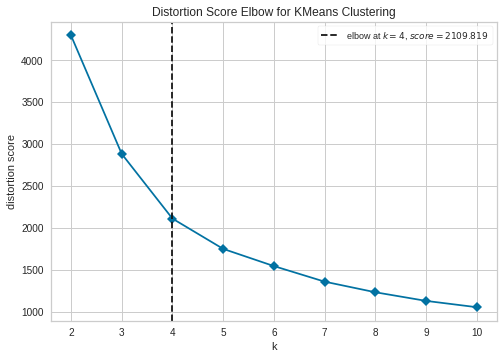

In [ ]:
plot_model(kmeans, plot = 'elbow')

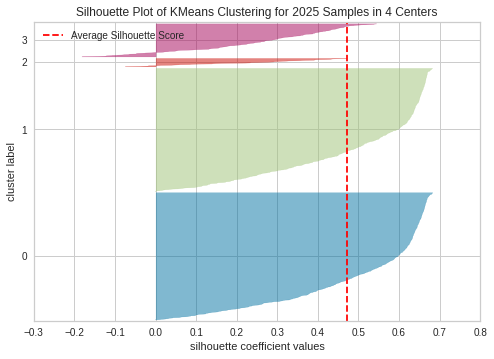

In [ ]:
plot_model(kmeans, plot = 'silhouette')

# **Interpret results and plan for actions**

In [ ]:
plot_model(kmeans, plot = 'distribution')

In [ ]:
results_1Visit['Cluster'].value_counts()

Cluster 0    883
Cluster 1    853
Cluster 3    230
Cluster 2     59
Name: Cluster, dtype: int64

In [ ]:
results_1Visit.head(10)

,CUST_CODE,TotalSpend,TotalVisits,TotalSKUs,FirstDate,LastDate,ToTalQUANTITY,total_days,recency,SalemoreOnepiecePer_SKU,Cluster
0,CUST0000000181,2.44,1,1,2007-01-06,2007-01-06,1,1,547,1.0,Cluster 1
6,CUST0000002257,1.99,1,1,2006-07-21,2006-07-21,1,1,716,1.0,Cluster 1
7,CUST0000002499,0.34,1,1,2006-04-14,2006-04-14,1,1,814,1.0,Cluster 1
10,CUST0000002638,15.59,1,4,2007-04-14,2007-04-14,6,1,449,1.5,Cluster 0
17,CUST0000003667,6.98,1,2,2007-01-11,2007-01-11,2,1,542,1.0,Cluster 1
19,CUST0000004507,2.35,1,2,2007-06-17,2007-06-17,2,1,385,1.0,Cluster 0
20,CUST0000004781,6.72,1,4,2007-10-25,2007-10-25,6,1,255,1.5,Cluster 0
26,CUST0000005626,0.70,1,1,2006-07-24,2006-07-24,1,1,713,1.0,Cluster 1
27,CUST0000006052,0.53,1,1,2006-12-26,2006-12-26,1,1,558,1.0,Cluster 1
28,CUST0000006087,6.35,1,4,2006-10-28,2006-10-28,12,1,617,3.0,Cluster 1


**TotalSpend**

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'TotalSpend')

**TotalSKUs**

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'TotalSKUs')

**ToTalQUANTITY**

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'ToTalQUANTITY')

**Recency**

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'recency')

In [ ]:
results_1Visit[results_1Visit.Cluster =='Cluster 0' ].describe()

,TotalSpend,TotalVisits,TotalSKUs,ToTalQUANTITY,total_days,recency,SalemoreOnepiecePer_SKU
count,883.000000,883.0,883.000000,883.000000,883.0,883.000000,883.000000
mean,3.852775,1.0,2.255946,3.027180,1.0,269.310306,1.334898
std,4.644706,0.0,1.805810,2.796448,0.0,104.813120,0.718804
min,0.010000,1.0,1.000000,1.000000,1.0,91.000000,1.000000
25%,0.890000,1.0,1.000000,1.000000,1.0,183.000000,1.000000
50%,2.070000,1.0,2.000000,2.000000,1.0,272.000000,1.000000
75%,4.810000,1.0,3.000000,4.000000,1.0,354.500000,1.333333
max,41.760000,1.0,11.000000,17.000000,1.0,459.000000,8.000000


In [ ]:
results_1Visit[results_1Visit.Cluster =='Cluster 1' ].describe()

,TotalSpend,TotalVisits,TotalSKUs,ToTalQUANTITY,total_days,recency,SalemoreOnepiecePer_SKU
count,853.000000,853.0,853.000000,853.000000,853.0,853.000000,853.000000
mean,4.025557,1.0,2.329426,3.098476,1.0,648.742087,1.323160
std,4.856103,0.0,1.897747,2.848632,0.0,101.929100,0.707892
min,0.010000,1.0,1.000000,1.000000,1.0,458.000000,1.000000
25%,0.980000,1.0,1.000000,1.000000,1.0,561.000000,1.000000
50%,2.190000,1.0,2.000000,2.000000,1.0,660.000000,1.000000
75%,5.190000,1.0,3.000000,4.000000,1.0,728.000000,1.250000
max,38.160000,1.0,10.000000,15.000000,1.0,818.000000,7.000000


In [ ]:
results_1Visit[results_1Visit.Cluster =='Cluster 2' ].describe()

,TotalSpend,TotalVisits,TotalSKUs,ToTalQUANTITY,total_days,recency,SalemoreOnepiecePer_SKU
count,59.000000,59.0,59.000000,59.000000,59.0,59.000000,59.000000
mean,66.801186,1.0,26.932203,46.864407,1.0,452.542373,2.011808
std,29.407531,0.0,8.618073,16.879346,0.0,202.949741,1.710146
min,31.420000,1.0,5.000000,28.000000,1.0,96.000000,1.068966
25%,45.810000,1.0,22.500000,35.000000,1.0,303.000000,1.349548
50%,61.190000,1.0,26.000000,40.000000,1.0,431.000000,1.565217
75%,79.780000,1.0,30.500000,57.000000,1.0,611.500000,2.096601
max,181.970000,1.0,51.000000,106.000000,1.0,814.000000,12.833333


In [ ]:
results_1Visit[results_1Visit.Cluster =='Cluster 3' ].describe()

,TotalSpend,TotalVisits,TotalSKUs,ToTalQUANTITY,total_days,recency,SalemoreOnepiecePer_SKU
count,230.000000,230.0,230.000000,230.000000,230.0,230.000000,230.000000
mean,26.940174,1.0,13.347826,19.286957,1.0,469.895652,1.564739
std,13.395208,0.0,4.511109,6.630965,0.0,209.130530,0.801558
min,6.310000,1.0,1.000000,3.000000,1.0,97.000000,1.000000
25%,17.000000,1.0,10.000000,15.000000,1.0,291.750000,1.186364
50%,23.520000,1.0,13.000000,18.000000,1.0,463.000000,1.400000
75%,33.542500,1.0,16.000000,22.750000,1.0,661.500000,1.666667
max,93.610000,1.0,26.000000,54.000000,1.0,817.000000,7.714286


In [ ]:
Cluster_0_1 =results_1Visit[results_1Visit.Cluster =='Cluster 0' ]
Cluster_1_1 =results_1Visit[results_1Visit.Cluster =='Cluster 1' ]
Cluster_2_1 =results_1Visit[results_1Visit.Cluster =='Cluster 2' ]
Cluster_3_1 =results_1Visit[results_1Visit.Cluster =='Cluster 3' ]


index = Cluster_0_1.index
C_0_1 = len(index)

index = Cluster_1_1.index
C_1_1 = len(index)

index = Cluster_2_1.index
C_2_1 = len(index)

index = Cluster_3_1.index
C_3_1 = len(index)

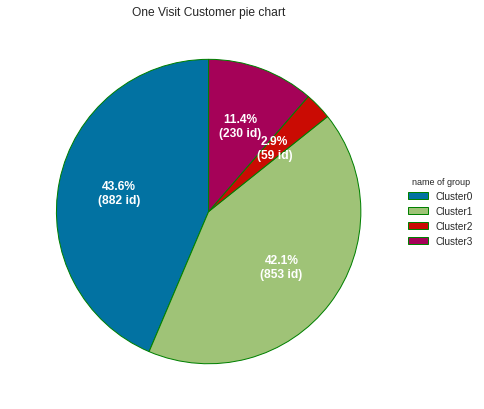

In [ ]:

# Import libraries
import numpy as np
import matplotlib.pyplot as plt

import matplotlib as mpl
mpl.rcParams['font.size'] = 9.0
  
  
# Creating dataset
TypeOfCustomer = ['Cluster0', 'Cluster1','Cluster2','Cluster3']
  
data = [C_0_1, C_1_1,C_2_1,C_3_1]
  
  
# Wedge properties
wp = { 'linewidth' : 1, 'edgecolor' : "green" }
  
# Creating autocpt arguments
def func(pct, allvalues):
    absolute = int(pct / 100.*np.sum(allvalues))
    return "{:.1f}%\n({:d} id)".format(pct, absolute)
  
# Creating plot
fig, ax = plt.subplots(figsize =(10, 7))
wedges, texts, autotexts = ax.pie(data, 
                                  autopct = lambda pct: func(pct, data),
                                  
                                  labels = TypeOfCustomer,
                                
                                 
                                  startangle = 90,
                                  wedgeprops = wp,
                                  textprops = dict(color="w")
                                  )
  
# Adding legend
ax.legend(wedges, TypeOfCustomer,
          title ="name of group",
          loc ="center left",
          bbox_to_anchor =(1, 0, 0.5, 1))
  
plt.setp(autotexts, size = 12, weight ="bold")
ax.set_title("One Visit Customer pie chart")
  
# show plot
plt.show()

#### **ผลลัพธ์จากการแบ่งกลุ่มของลูกค้าที่มาใช้บริการเพียง 1 ครั้งโดยใช้ KMeans Clustering สรุปได้ดังนี้**

#### **1.) Cluster 0** : Invisible man
- มีจำนวนลูกค้า ~ 860 คน (~42.51% ของลูกค้าที่เคยมาเพียง 1 ครั้ง และ ~14.11 % ของลูกค้าทั้งหมด) 
- มีรายรับจากลูกค้า (Total spend) ของกลุ่ม 0 ในระดับน้อย ( ~ 4.16 )
- ความหลากหลายในการเลือกซื้อสินค้า (SKUs) น้อยอยู่ในระดับน้อย ( ~ 2 SKUs )
- ปริมาณที่ซื้อต่อครั้งอยู่ในระดับน้อย ( ~ 3 ชิ้น )
- ลูกค้ามาครั้งล่าสุด (Recency) เมื่อ ~ 650 วันก่อน  **(~ 1 ปี 9 เดือน)

จากข้อมูลข้างต้น สรุปได้ว่าลูกค้ากลุ่มที่ 0 เป็นกลุ่ม ลูกค้าที่มียอดซื้อรวมสินค้าน้อย ปริมาณที่ซื้อต่อครั้งน้อย  ซื้อสินค้าไม่หลากหลาย และมาใช้บริการเมื่อนานมากแล้ว 

**หน้าที่ของเราคือ**  
 ไม่ทำอะไรเลย เพราะลูกค้าเป็นกลุ่ม Low Value และไม่ได้มาใช้บริการนานมากแล้ว อาจเป็นลูกค้าที่เเวะมาใช้บริการแค่ผ่านทาง


#### **2.) Cluster 1** : Top invisible man
- มีจำนวนลูกค้า ~ 889 คน (~43.9% ของลูกค้าที่เคยมาเพียง 1 ครั้ง และ ~14.57 % ของลูกค้าทั้งหมด) 
- มีรายรับจากลูกค้า (Total spend) ของกลุ่ม 1 น้อยที่สุด ( ~ 3.93 )
- ความหลากหลายในการเลือกซื้อสินค้า (SKUs) น้อยอยู่ในระดับน้อย ( ~ 2 SKUs )
- ปริมาณที่ซื้อต่อครั้งอยู่ในระดับน้อย ( ~ 3 ชิ้น )
- ลูกค้ามาครั้งล่าสุด (Recency) เมื่อ ~ 268 วันก่อน ซึ่งน้อยที่สุด **(~ 9 เดือน) 

จากข้อมูลข้างต้น สรุปได้ว่าลูกค้ากลุ่มที่ 1 เป็นกลุ่ม ลูกค้ากลุ่มนี้มียอดซื้อรวมน้อย ปริมาณที่ซื้อต่อครั้งน้อย  ซื้อสินค้าไม่หลากหลาย **แต่ระยะเวลาที่มาใช้บริการสั้นที่สุด และยังเป็นสัดส่วนส่วนของลูกค้าที่ค่อนข้างมาก จึงเป็นกลุ่มที่ควรจะทำให้มาเป็นลูกค้าประจำ** 

**หน้าที่ของเราคือ**  
 ต้องพยายามดึงมาเป็นลูกค้าประจำ เพราะลูกค้าเป็นกลุ่ม Low Value มีสัดส่วนถึง 14 % ของลูกค้าทั้งหมด และมาใช้บริการภายในปีนี้  



### **3.) Cluster 2** : Middle invisible man
- มีจำนวนลูกค้า ~ 216 คน (~10.67% ของลูกค้าที่เคยมาเพียง 1 ครั้ง และ ~3.54 % ของลูกค้าทั้งหมด) 
- มีรายรับจากลูกค้า (Total spend) ของกลุ่ม 2 อยู่ในอันดับที่ 2 ( ~ 27.58 )
- ความหลากหลายในการเลือกซื้อสินค้า (SKUs) มากเป็นอันดับที่ 2 ( ~ 13.6 SKUs )
- ปริมาณที่ซื้อต่อครั้งมากเป็นอันดับที่ 2 ( ~ 19 ชิ้น )
- ลูกค้ามาครั้งล่าสุด (Recency) เมื่อ ~ 466 วันก่อน ซึ่ง **(~ 1 ปี 3 เดือน) 


จากข้อมูลข้างต้น สรุปได้ว่าลูกค้ากลุ่มที่ 2 
ลูกค้ากลุ่มนี้มียอดซื้อรวม ปริมาณที่ซื้อต่อครั้ง และความหลากหลายในการซื้ออยู่ในระดับกลาง เป็นกลุ่มลูกค้าที่ซื้อสินค้าชนิดเดียวกันหลายชิ้น **แต่ระยะเวลาที่มาใช้บริการล่าสุดมากที่สุด** 

### **4.) Cluster 3** : Need to win back
- มีจำนวนลูกค้า ~ 60 คน (~ 2.91% ของลูกค้าที่เคยมาเพียง 1 ครั้ง และ ~1 % ของลูกค้าทั้งหมด) 
- มีรายรับจากลูกค้า (Total spend)  มากที่สุด ( ~ 66.8 )
- ความหลากหลายในการเลือกซื้อสินค้า (SKUs) มากที่สุด ( ~ 26.93 SKUs )
- ปริมาณที่ซื้อต่อครั้งมากเป็นอันดับที่ 2 ( ~ 46.86 ชิ้น )
- ลูกค้ามาครั้งล่าสุด (Recency) เมื่อ ~ 452 วันก่อน ซึ่ง **(~ 1 ปี 3 เดือน) 

จากข้อมูลข้างต้น สรุปได้ว่าลูกค้ากลุ่มที่ 3 นี้เป็นกลุ่ม upper-middle  ลูกค้ากลุ่มนี้มียอดซื้อรวม ปริมาณที่ซื้อต่อครั้ง และความหลากหลายในการซื้อมากที่สุด และอยู่ในระดับค่อนข้างสูง  เป็นกลุ่มลูกค้าที่ซื้อสินค้าชนิดเดียวกันหลายชิ้น **แต่ระยะเวลาที่มาใช้บริการล่าสุดค่อนข้างมาก** อาจเป็นลูกค้าที่มาซื้อในช่วงที่มีโปรโมชั่นลดราคาเยอะๆ อาจเป็นกลุ่มร้านค้า Retail

**หน้าที่ของเราคือ**  
 พยายามดึงมาเป็นลูกค้าประจำ เพราะลูกค้าเป็นกลุ่ม High Value แต่ไม่ใช่ลูกค้าที่มาใช้บริการบ่อยๆ โดยทำการส่งโฆษณาโปรโมชั่นให้ลูกค้าในช่วงที่ร้านจัดกิจกรรม หรือมีสินค้าที่เคยซื้อจัดโปรโมชั่นให้ตรงกับความต้องการของลูกค้า



 

